In [1]:
import os
import torch
from torch import nn
import numpy as np
import cv2

import matplotlib.pyplot as plt

In [2]:
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg

--2021-06-11 19:14:37--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8342 (8.1K) [text/plain]
Saving to: ‘yolov3.cfg’

yolov3.cfg          100%[===================>]   8.15K  --.-KB/s    in 0s      

2021-06-11 19:14:37 (71.0 MB/s) - ‘yolov3.cfg’ saved [8342/8342]



In [3]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2021-06-11 19:14:41--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  41.6MB/s    in 6.1s    

2021-06-11 19:14:47 (38.9 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [4]:
!wget https://raw.githubusercontent.com/ayooshkathuria/YOLO_v3_tutorial_from_scratch/master/data/coco.names

--2021-06-11 19:14:47--  https://raw.githubusercontent.com/ayooshkathuria/YOLO_v3_tutorial_from_scratch/master/data/coco.names
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 625 [text/plain]
Saving to: ‘coco.names’

coco.names          100%[===================>]     625  --.-KB/s    in 0s      

2021-06-11 19:14:48 (26.8 MB/s) - ‘coco.names’ saved [625/625]



In [5]:
!cat "yolov3.cfg"

[net]
# Testing
# batch=1
# subdivisions=1
# Training
batch=64
subdivisions=16
width=608
height=608
channels=3
momentum=0.9
decay=0.0005
angle=0
saturation = 1.5
exposure = 1.5
hue=.1

learning_rate=0.001
burn_in=1000
max_batches = 500200
policy=steps
steps=400000,450000
scales=.1,.1

[convolutional]
batch_normalize=1
filters=32
size=3
stride=1
pad=1
activation=leaky

# Downsample

[convolutional]
batch_normalize=1
filters=64
size=3
stride=2
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=32
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=64
size=3
stride=1
pad=1
activation=leaky

[shortcut]
from=-3
activation=linear

# Downsample

[convolutional]
batch_normalize=1
filters=128
size=3
stride=2
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=64
size=1
stride=1
pad=1
activation=leaky

[convolutional]
batch_normalize=1
filters=128
size=3
stride=1
pad=1
activation=leaky

[shortcut]
from=-3
activation=linear

[convolutiona

In [ ]:
def anchors_parser(value):
    anchors = list(map(int, value.split(',')))
    anchors = [(anchors[i], anchors[i + 1]) for i in range(0, len(anchors), 2)]
    return anchors


def list_parser(value, parser=int, separator=','):
    result = list(map(parser, value.split(separator)))
    return result


def list_int_parser(value):
    return list_parser(value)


def list_float_parser(value):
    return list_parser(value, parser=float)


PARSERS={
    'default_key': int,
    'activation': str,
    'policy': str,
    'jitter': float,
    'saturation': float,
    'exposure': float,
    'hue': float,
    'momentum': float,
    'decay': float,
    'learning_rate': float,
    'ignore_thresh': float,
    'truth_thresh': float,
    'angle': float,
    'anchors': anchors_parser,
    'scales': list_float_parser,
    'steps': list_int_parser,
    'mask': list_int_parser,
    'layers': list_int_parser,
}


class ValueParser:
    def parse(self, key, value):
        if key not in PARSERS:
            key = 'default_key'
        return PARSERS[key](value)


class ConfigParser:
    def _line_filter(self, line):
        if len(line) == 0:
            return False
        if line[0] == '#':
            return False
        return True
    
    def _line_preprocess(self, line):
        return line.strip()

    def parse(self, cfg_path):
        value_parser = ValueParser()
        with open(cfg_path, 'r') as config_file:
            lines = list(config_file)
        lines = list(map(self._line_preprocess, lines))
        lines = list(filter(self._line_filter, lines))
        blocks = []
        block = None
        for line in lines:
            if line[0] == '[':
                if block is not None:
                    blocks.append(block)
                block = {'type': line[1:-1].strip()}
            else:
                key, value = line.split("=")
                key, value = key.strip(), value.strip()
                block[key] = value_parser.parse(key, value)
        if block is not None:
            blocks.append(block)
        return blocks

In [ ]:
def parse_config(config_path):
    def line_preprocess(line):
        return line.strip()

    def line_filter(line):
        if len(line) == 0:
            return False
        if line[0] == '#':
            return False
        return True
        
    with open(config_path, 'r') as config_file:
        lines = list(config_file)
    lines = list(map(line_preprocess, lines))
    lines = list(filter(line_filter, lines))

    blocks = []
    block = None
    for line in lines:
        if line[0] == '[':
            if block is not None:
                blocks.append(block)
            block = Block(line[1:-1].strip())
            block['type'] = line[1:-1].strip()
        else:
            key, value = line.split("=")
            block[key.rstrip()] = value.lstrip()
    if block is not None:
        blocks.append(block)
    return blocks

In [ ]:
class EmptyLayer(nn.Module):
    def __init__(self):
        super(EmptyLayer, self).__init__()

In [ ]:
class DetectionLayer(nn.Module):
    def __init__(self, anchors):
        super(DetectionLayer, self).__init__()
        self.anchors = anchors

In [ ]:
def parse_config(config_path):
    def line_preprocess(line):
        return line.strip()

    def line_filter(line):
        if len(line) == 0:
            return False
        if line[0] == '#':
            return False
        return True
        
    with open(config_path, 'r') as config_file:
        lines = list(config_file)
    lines = list(map(line_preprocess, lines))
    lines = list(filter(line_filter, lines))

    blocks = []
    block = None
    for line in lines:
        if line[0] == '[':
            if block is not None:
                blocks.append(block)
            block = {}
            block['type'] = line[1:-1].strip()
        else:
            key, value = line.split("=")
            block[key.rstrip()] = value.lstrip()
    if block is not None:
        blocks.append(block)
    return blocks

In [ ]:
def create_modules(blocks):
    net_info = blocks[0]
    module_list = nn.ModuleList()
    prev_filters = 3
    output_filters = []
    for index, block in enumerate(blocks[1:]):
        module = nn.Sequential()
        if block['type'] == 'convolutional':
            activation = block['activation']
            filters= int(block["filters"])
            padding = int(block["pad"])
            kernel_size = int(block["size"])
            stride = int(block["stride"])
            if 'batch_normalize' in block:
                batch_normalize = int(block['batch_normalize'])
            else:
                batch_normalize = 0
            bias = batch_normalize == 0
            if padding:
                pad = (kernel_size - 1) // 2
            else:
                pad = 0
            conv = nn.Conv2d(
                prev_filters, filters, kernel_size,
                stride, pad, bias=bias
            )
            module.add_module(f'conv_{index}', conv)
            if batch_normalize:
                bn = nn.BatchNorm2d(filters)
                module.add_module(f'batch_norm_{index}', bn)
            if activation == 'leaky':
                act = nn.LeakyReLU(0.1, inplace=True)
                module.add_module(f'leaky_{index}', act)
        if block['type'] == 'upsample':
            stride = int(block['stride'])
            upsample = nn.Upsample(scale_factor=stride, mode='bilinear', align_corners=True)
            module.add_module(f'upsample_{index}', upsample)
        if block['type'] == 'route':
            values = block['layers'].split(',')
            start = int(values[0])
            if len(values) == 2:
                end = int(values[1])
            else:
                end = 0
            if start > 0:
                start = start - index
            if end > 0:
                end = end - index
            route = EmptyLayer()
            module.add_module(f'route_{index}', route)
            if end < 0:
                filters = output_filters[index + start] + output_filters[index + end]
            else:
                filters= output_filters[index + start]
        if block['type'] == 'shortcut':
            shortcut = EmptyLayer()
            module.add_module(f'shortcut_{index}', shortcut)
        if block['type'] == 'yolo':
            mask = list(map(int, block['mask'].split(',')))
            anchors = list(map(int, block['anchors'].split(',')))
            anchors = [(anchors[i], anchors[i+1]) for i in range(0, len(anchors), 2)]
            anchors = [anchors[i] for i in mask]
            detection = DetectionLayer(anchors)
            module.add_module(f'Detection_{index}', detection)
        module_list.append(module)
        prev_filters = filters
        output_filters.append(filters)
    return (net_info, module_list)

In [ ]:
def create_modules_2(blocks):
    net_info = blocks[0]
    module_list = nn.ModuleList()
    prev_filters = 3
    output_filters = []
    for index, block in enumerate(blocks[1:]):
        module = nn.Sequential()
        if block['type'] == 'convolutional':
            activation = block['activation']
            filters= block["filters"]
            padding = block["pad"]
            kernel_size = block["size"]
            stride = block["stride"]
            if 'batch_normalize' in block:
                batch_normalize = block['batch_normalize']
            else:
                batch_normalize = 0
            bias = batch_normalize == 0
            if padding:
                pad = (kernel_size - 1) // 2
            else:
                pad = 0
            conv = nn.Conv2d(
                prev_filters, filters, kernel_size,
                stride, pad, bias=bias
            )
            module.add_module(f'conv_{index}', conv)
            if batch_normalize:
                bn = nn.BatchNorm2d(filters)
                module.add_module(f'batch_norm_{index}', bn)
            if activation == 'leaky':
                act = nn.LeakyReLU(0.1, inplace=True)
                module.add_module(f'leaky_{index}', act)
        if block['type'] == 'upsample':
            stride = block['stride']
            upsample = nn.Upsample(scale_factor=stride, mode='bilinear', align_corners=True)
            module.add_module(f'upsample_{index}', upsample)
        if block['type'] == 'route':
            values = block['layers']
            start = values[0]
            if len(values) == 2:
                end = values[1]
            else:
                end = 0
            if start > 0:
                start = start - index
            if end > 0:
                end = end - index
            route = EmptyLayer()
            module.add_module(f'route_{index}', route)
            if end < 0:
                filters = output_filters[index + start] + output_filters[index + end]
            else:
                filters= output_filters[index + start]
        if block['type'] == 'shortcut':
            shortcut = EmptyLayer()
            module.add_module(f'shortcut_{index}', shortcut)
        if block['type'] == 'yolo':
            mask = block['mask']
            anchors = block['anchors']
            anchors = [anchors[i] for i in mask]
            detection = DetectionLayer(anchors)
            module.add_module(f'Detection_{index}', detection)
        module_list.append(module)
        prev_filters = filters
        output_filters.append(filters)
    return (net_info, module_list)

In [ ]:
def predict_transform(prediction, input_dim, anchors, num_classes, CUDA=True):
    batch_size = prediction.size(0)
    stride = input_dim // prediction.size(2)
    grid_size = input_dim // stride
    bbox_attrs = 5 + num_classes
    num_anchors = len(anchors)

    prediction = prediction.view(batch_size, bbox_attrs * num_anchors, grid_size * grid_size)
    prediction = prediction.transpose(1, 2).contiguous()
    prediction = prediction.view(batch_size, grid_size * grid_size * num_anchors, bbox_attrs)
    anchors = [(a[0] / stride, a[1] / stride) for a in anchors]
    prediction[:, :, 0] = torch.sigmoid(prediction[:, :, 0])
    prediction[:, :, 1] = torch.sigmoid(prediction[:, :, 1])
    prediction[:, :, 4] = torch.sigmoid(prediction[:, :, 4])
    prediction[:, :, 5: 5 + num_classes] = torch.sigmoid((prediction[:,:, 5 : 5 + num_classes]))

    grid = np.arange(grid_size)
    a,b = np.meshgrid(grid, grid)
    x_offset = torch.FloatTensor(a).view(-1,1)
    y_offset = torch.FloatTensor(b).view(-1,1)
    if CUDA:
        x_offset = x_offset.cuda()
        y_offset = y_offset.cuda()
    x_y_offset = torch.cat((x_offset, y_offset), 1).repeat(1,num_anchors).view(-1,2).unsqueeze(0)
    prediction[:, :, :2] += x_y_offset

    anchors = torch.FloatTensor(anchors)
    if CUDA:
        anchors = anchors.cuda()
    anchors = anchors.repeat(grid_size * grid_size, 1).unsqueeze(0)
    prediction[:, :, 2:4] = torch.exp(prediction[:,:,2:4]) * anchors
    prediction[:,:,:4] *= stride
    return prediction

In [6]:
def bbox_area(bbox):
    w = torch.clamp((bbox[..., 2] - bbox[..., 0]), min=0)
    h = torch.clamp((bbox[..., 3] - bbox[..., 1]), min=0)
    result = w * h
    return result

def bbox_intersection(bbox_1, bbox_2):
    inter_x1 = torch.maximum(bbox_1[..., 0], bbox_2[..., 0]).unsqueeze(-1)
    inter_y1 = torch.maximum(bbox_1[..., 1], bbox_2[..., 1]).unsqueeze(-1)
    inter_x2 = torch.minimum(bbox_1[..., 2], bbox_2[..., 2]).unsqueeze(-1)
    inter_y2 = torch.minimum(bbox_1[..., 3], bbox_2[..., 3]).unsqueeze(-1)
    return torch.cat((inter_x1, inter_y1, inter_x2, inter_y2), -1)

def bbox_iou(bbox_1, bbox_2):
    size_1 = bbox_1.size(0)
    size_2 = bbox_2.size(0)
    bbox_1 = bbox_1.expand(size_2, -1, -1).transpose(0, 1)
    bbox_2 = bbox_2.expand(size_1, -1, -1)
    areas_1 = bbox_area(bbox_1)
    areas_2 = bbox_area(bbox_2)
    bbox_inter = bbox_intersection(bbox_1, bbox_2)
    areas_inter = bbox_area(bbox_inter)
    result = areas_inter / (areas_1 + areas_2 - areas_inter)
    result = result
    return result

In [7]:
bbox_1 = torch.tensor([[0, 0, 2, 2], [2, 1, 4, 3]], dtype=torch.float32)
bbox_2 = torch.tensor([[1, 1, 3, 3], [5, 5, 6, 6]], dtype=torch.float32)
area = bbox_area(bbox_1)
iou = bbox_iou(bbox_1, bbox_2)
print(area)
print(iou)
print(iou.size())

tensor([4., 4.])
tensor([[0.1429, 0.0000],
        [0.3333, 0.0000]])
torch.Size([2, 2])


In [8]:
def get_area_range_indices(bboxes, area_range):
    '''
    bboxes - array[[x1, y1, x2, y2]], [n_targets * 5]
    area_range - (min, max)
    '''
    ind = torch.arange(bboxes.size(0))
    if area_range is not None:
        areas = bbox_area(bboxes)
        selection = (areas >= area_range[0])
        selection &= (areas <= area_range[1])
        ind = torch.where(selection)[0]
    return ind


def bbox_match(preds, targets, ious, iou_threshold=0.5, n_preds=None, area_range=None):
    '''
    preds - array[[x1, y1, x2, y2, conf]], [n_preds * 5]
    targets - array[[x1, y1, x2, y2]], [n_targets * 4]
    ious - array[array[float]], [n_preds * n_targets]
    area_range - (min, max)
    '''
    confidences, indices = torch.sort(preds[:, 4], descending=True)

    indices = indices[:n_preds]

    target_indices = get_area_range_indices(targets, area_range)
    print(target_indices)

    targets_matched = {}
    preds_matched = {}
    for p_id in indices:
        p_id = p_id.item()
        t_m = -1
        iou = min(iou_threshold, 1 - 1e-10)
        for t_id in target_indices:
            t_id = t_id.item()
            if t_id in targets_matched:
                continue
            if ious[p_id, t_id] < iou:
                continue
            t_m = t_id
            iou = ious[p_id, t_id]
        if t_m == -1:
            continue
        targets_matched[t_m] = p_id
        preds_matched[p_id] = t_m
    
    result = {
        'index': indices,
        'confidence': confidences,
        'match': torch.tensor([preds_matched[i.item()] if i.item() in preds_matched else -1 for i in indices], dtype=torch.int64),
    }

    bboxes = preds[indices]
    bboxes = bboxes[:, :4]
    unmached_indices = get_area_range_indices(bboxes, area_range)
    unmached_filter = (result['match'] != -1)
    unmached_filter[unmached_indices] = True
    result = {k: v[unmached_filter] for k, v in result.items()}
    return result


def compute_interpolated_precision(precision, recall, recall_thresholds):
    '''
    precision - array[], [n]
    recall - array[], [n]
    recall_thresholds - array[], [n_thr]
    '''
    n = precision.size(0)
    max_precision = precision[::-1].cummax(0).values[::-1]
    inds = torch.searchsorted(recall, recall_thresholds, right=False)
    inds = inds[inds < n]
    interpolated_precsion = max_precision[inds]
    return interpolated_precision


def compute_metrics(index, match, confidence, num_targets, recall_thresholds=None):
    '''
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
    num_targets = TP + FN
    '''
    result = {
        'precision': None,
        'recall': None,
        'AP': None,
        'TP': None,
        'FP': None,
        'num_targets': num_targets,
    }
    if num_targets == 0:
        return result
    tp = (match >= 0).cumsum(0)
    fp = (match < 0).cumsum(0)
    precision = tp / (tp + fp)
    recall = tp / num_targets
    result['recall'] = recall
    result['precision'] = precision
    result['TP'] = tp
    result['FP'] = fp
    if recall_thresholds is None:
        recall_thresholds = torch.linspace(0., 1., 101)
    interpolated_precision = compute_interpolated_precision(precision, recall, recall_thresholds)
    average_precision = interpolated_precision.mean(0)
    result['AP'] = average_precision
    return result


def bbox_metrics(preds, targets, iou_threshold=0.5, n_preds=None, area_range=None, recall_thresholds=None):
    '''
    preds - array[[x1, y1, x2, y2, conf]], [n_preds * 5]
    targets - array[[x1, y1, x2, y2]], [n_targets * 4]
    '''
    ious = bbox_iou(preds[:, :4], targets[:, :4])
    match = bbox_match(
        preds[:5], targets[:, :4], ious,
        iou_threshold=iou_threshold,
        n_preds=n_preds,
        area_range=area_range
    )
    metrics = compute_metrics(
        match['index'],
        match['match'],
        match['confidence'],
        targets.size(0),
        recall_thresholds=recall_thresholds
    )
    return metrics


def loss_yolo(preds, targets):
    pass

In [9]:
p = torch.tensor([[0., 0., 2. , 2., 0.7], [1.1, 0.1, 3.1, 2.1, 0.8]], dtype=torch.float32)
t = torch.tensor([[1., 0., 2. , 2.], [1.05, 0.05, 3.05, 2.05]], dtype=torch.float32)
ious = bbox_iou(p, t)
print(ious)
bbox_match(p, t, ious, iou_threshold=0.5, area_range=(0.0, 3.))

tensor([[0.5000, 0.3013],
        [0.3986, 0.9059]])
tensor([0])


{'confidence': tensor([0.7000]), 'index': tensor([0]), 'match': tensor([0])}

In [24]:
a = torch.tensor([0., 0., 0.1, 0.1, 0.5, 0.6, 0.7, 0.7, 0.9])
v = torch.linspace(0., 1., 101)
inds = torch.searchsorted(a, v)
inds

tensor([0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 8,
        8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9,
        9, 9, 9, 9, 9])

In [29]:
a.mean(0)

tensor(0.4000)

In [23]:
a.size()

torch.Size([9])

In [21]:
print(a.cumsum(0))
print(a.cummax(0).values)

tensor([ 2,  3,  7, 11, 19, 21, 25, 31, 33, 36])
tensor([2, 2, 4, 4, 8, 8, 8, 8, 8, 8])


In [ ]:
def write_results(prediction, confidence, num_classes, nms_conf = 0.4):
    box_corner = torch.zeros_like(prediction[:, :, :4])
    box_corner[:, :, 0] = (prediction[:, :, 0] - prediction[:, :, 2]/2)
    box_corner[:, :, 1] = (prediction[:, :, 1] - prediction[:, :, 3]/2)
    box_corner[:, :, 2] = (prediction[:, :, 0] + prediction[:, :, 2]/2)
    box_corner[:, :, 3] = (prediction[:, :, 1] + prediction[:, :, 3]/2)
    prediction[:, :, :4] = box_corner
    batch_size = prediction.size(0)
    output = []
    for ind in range(batch_size):
        res = []
        image_pred = prediction[ind]
        max_conf, max_conf_score = torch.max(image_pred[:,5:5+ num_classes], 1)
        max_conf = max_conf.float().unsqueeze(1)
        max_conf_score = max_conf_score.float().unsqueeze(1)
        seq = (image_pred[:,:5], max_conf, max_conf_score)
        image_pred = torch.cat(seq, 1)
        if (image_pred[:, 4] <= confidence).all().item():
            continue
        image_pred_ = image_pred[image_pred[:, 4] > confidence]
        image_classes = torch.unique(image_pred_[:, -1])
        for cls in image_classes:
            image_pred_class = image_pred_[image_pred_[:,-1] == cls]
            conf_sort_index = torch.sort(image_pred_class[:, 4], descending =True)[1]
            image_pred_class = image_pred_class[conf_sort_index]
            bboxes = image_pred_class.size(0)
            while image_pred_class.size(0) > 0:
                res.append(image_pred_class[0].unsqueeze(0))
                if image_pred_class.size(0) == 1:
                    break
                ious = bbox_iou(image_pred_class[0, :4].unsqueeze(0), image_pred_class[1:, :4]).squeeze(0)
                image_pred_class = image_pred_class[1:]
                image_pred_class = image_pred_class[ious < nms_conf]
        if len(res) != 0:
            res = torch.cat(res, 0)
        else:
            res = None
        output.append(res)
    return output

In [ ]:
def read_img(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [ ]:
def aspect_transform(w, h, w_new, h_new):
    alpha = min(h_new / h, w_new / w)
    x_offset = (w_new - alpha * w) / 2
    y_offset = (h_new - alpha * h) / 2
    return alpha, x_offset, y_offset

In [ ]:
def inv_aspect_transform_results(bboxes, asp):
    alpha, xo, yo = asp
    bboxes = bboxes.detach().clone()
    bboxes[:, [0, 2]] = (bboxes[:, [0, 2]] - xo) / alpha
    bboxes[:, [1, 3]] = (bboxes[:, [1, 3]] - yo) / alpha
    return bboxes

In [ ]:
def clamp_results(bboxes, w, h):
    bboxes = bboxes.detach().clone()
    bboxes[:, [0, 2]] = torch.clamp(bboxes[:, [0, 2]], min=0, max=w)
    bboxes[:, [1, 3]] = torch.clamp(bboxes[:, [1, 3]], min=0, max=h)
    return bboxes

In [ ]:
def resize_aspect(img, w, h):
    img_w = img.shape[1]
    img_h = img.shape[0]
    alpha, xo, yo = aspect_transform(img_w, img_h, w, h)
    new_w = int(img_w * alpha)
    new_h = int(img_h * alpha)
    new_img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_CUBIC)
    canvas = np.full((h, w, 3), 128)
    c1 = (int(xo), int(yo))
    c2 = (c1[0] + new_w, c1[1] + new_h)
    canvas[c1[1]: c2[1], c1[0]: c2[0], :] = new_img
    return canvas.astype(np.uint8)

In [ ]:
def uniform_color_palette(num_classes):
    hues = np.linspace(0, 160, num=num_classes).astype(np.uint8)
    palette = np.full((num_classes, 3), 255, dtype=np.uint8)
    palette[:, 0] = hues
    palette = palette[np.newaxis]
    palette = cv2.cvtColor(palette, cv2.COLOR_HSV2RGB)
    return palette

def draw_palette(palette, height=40, width=10):
    img = palette.repeat(width, axis=1)
    img = np.tile(img, (height, 1, 1))
    return img

In [ ]:
p = uniform_color_palette(80)
p_img = draw_palette(p)
plt.imshow(p_img)
plt.axis('off')
plt.show()

In [ ]:
def draw_bbox(img, bbox, label, color, linewidth=1, fontscale=1., fontthickness=1):
    c1 = tuple(bbox[0:2].int().numpy())
    c2 = tuple(bbox[2:4].int().numpy())
    img = cv2.rectangle(img, c1, c2, color, linewidth)
    t_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_PLAIN, fontscale, fontthickness)[0]
    if c1[1] - t_size[1] >= 0:
        c1 = c1[0], c1[1] - t_size[1]
    c2 = c1[0] + t_size[0], c1[1] + t_size[1]
    img = cv2.rectangle(img, c1, c2, color, -1)
    img = cv2.putText(img, label, (c1[0], c1[1] + t_size[1]), cv2.FONT_HERSHEY_PLAIN, fontscale, [0,0,0], fontthickness)
    return img

def draw_predictions(img, bboxes, palette, classes):
    img_bbox = img.copy()
    for bbox in bboxes:
        cls = int(bbox[-1])
        color = list(map(int, palette[0, cls])) # wtf?? doesn't work with np types
        label = classes[cls]
        scale = max(*img.shape[:2]) / 416
        width = max(1, int(scale))
        thickness = max(1, int(scale))
        img_bbox = draw_bbox(
            img_bbox, bbox.cpu(), label, color,
            linewidth=width, fontscale=scale, fontthickness=thickness
        )
    return img_bbox

In [ ]:
def img_to_tensor(img):
    img = torch.from_numpy(img).float().permute(2,0,1).unsqueeze(0) / 255
    return img

In [ ]:
def load_classes(names_path):
    with open(names_path, 'r') as names_file:
        names = [line.strip() for line in names_file]
    return names

In [ ]:
# blocks = parse_config('yolov3.cfg')

In [ ]:
# modules = create_modules(blocks)

In [ ]:
# modules
# list(filter(lambda x: x['type'][0] == 'y', blocks))

In [ ]:
class Darknet(nn.Module):
    def __init__(self, cfg_path):
        super(Darknet, self).__init__()
        parser = ConfigParser()
        self.blocks = parser.parse(cfg_path)
        self.net_info, self.module_list = create_modules_2(self.blocks)
    
    def forward(self, x, CUDA):
        modules = self.blocks[1:]
        outputs = {}
        detections = None
        for i, module in enumerate(modules):
            module_type = modules[i]['type']
            if module_type == 'convolutional' or module_type == 'upsample':
                x = self.module_list[i](x)
            elif module_type == 'route':
                layers = module['layers']
                if layers[0] > 0:
                    layers[0] = layers[0] - i
                if len(layers) == 1:
                    x = outputs[i + layers[0]]
                else:
                    if layers[1] > 0:
                        layers[1] = layers[1] - i
                    m1 = outputs[i + layers[0]]
                    m2 = outputs[i + layers[1]]
                    x = torch.cat((m1, m2), 1)
            elif module_type == 'shortcut':
                from_ = module["from"]
                x = outputs[i-1] + outputs[i+from_]
            elif module_type == 'yolo':
                anchors = self.module_list[i][0].anchors
                input_dim = self.net_info["height"]
                num_classes = module["classes"]
                x = x.detach()
                x = predict_transform(x, input_dim, anchors, num_classes, CUDA)
                if detections is None:
                    detections = x
                else:
                    detections = torch.cat((detections, x), 1)
            outputs[i] = x
        return detections


    def load_weights(self, weights_path):
        with open(weights_path, 'rb') as weights_file:
            header = np.fromfile(weights_file, dtype = np.int32, count = 5)
            self.header = torch.from_numpy(header)
            self.seen = self.header[3]
            weights = np.fromfile(weights_file, dtype = np.float32)
        ptr = 0
        with torch.no_grad():
            for i in range(len(self.module_list)):
                module_type = self.blocks[i + 1]['type']
                if module_type == 'convolutional':
                    model = self.module_list[i]
                    conv = model[0]
                    if 'batch_normalize' in self.blocks[i + 1]:
                        batch_normalize = self.blocks[i + 1]['batch_normalize']
                    else:
                        batch_normalize = 0
                    if batch_normalize == 1:
                        bn = model[1]

                        #Get the number of weights of Batch Norm Layer
                        num_bn_biases = bn.bias.numel()

                        #Load the weights
                        bn_biases = torch.from_numpy(weights[ptr:ptr + num_bn_biases])
                        ptr += num_bn_biases

                        bn_weights = torch.from_numpy(weights[ptr: ptr + num_bn_biases])
                        ptr  += num_bn_biases

                        bn_running_mean = torch.from_numpy(weights[ptr: ptr + num_bn_biases])
                        ptr  += num_bn_biases

                        bn_running_var = torch.from_numpy(weights[ptr: ptr + num_bn_biases])
                        ptr  += num_bn_biases

                        #Cast the loaded weights into dims of model weights. 
                        bn_biases = bn_biases.view_as(bn.bias)
                        bn_weights = bn_weights.view_as(bn.weight)
                        bn_running_mean = bn_running_mean.view_as(bn.running_mean)
                        bn_running_var = bn_running_var.view_as(bn.running_var)

                        #Copy the data to model
                        bn.bias.copy_(bn_biases)
                        bn.weight.copy_(bn_weights)
                        bn.running_mean.copy_(bn_running_mean)
                        bn.running_var.copy_(bn_running_var)
                    else:
                        #Number of biases
                        num_biases = conv.bias.numel()

                        #Load the weights
                        conv_biases = torch.from_numpy(weights[ptr: ptr + num_biases])
                        ptr = ptr + num_biases

                        #reshape the loaded weights according to the dims of the model weights
                        conv_biases = conv_biases.view_as(conv.bias)

                        #Finally copy the data
                        conv.bias.copy_(conv_biases)
                    
                    num_weights = conv.weight.numel()

                    #Do the same as above for weights
                    conv_weights = torch.from_numpy(weights[ptr:ptr+num_weights])
                    ptr = ptr + num_weights

                    conv_weights = conv_weights.view_as(conv.weight)
                    conv.weight.copy_(conv_weights)

In [ ]:
num_classes = 80
classes = load_classes('coco.names')

In [ ]:
palette = uniform_color_palette(num_classes)
pos = np.arange(0, palette.shape[1], 1)
np.random.shuffle(pos)
palette = palette[:, pos]

In [ ]:
CUDA = torch.cuda.is_available()
print(CUDA)

False


In [ ]:
model = Darknet('yolov3.cfg')
model.load_weights('yolov3.weights')
if CUDA:
    model.cuda()
model.eval()

Darknet(
  (module_list): ModuleList(
    (0): Sequential(
      (conv_0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batch_norm_0): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky_0): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (1): Sequential(
      (conv_1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (batch_norm_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky_1): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (2): Sequential(
      (conv_2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (batch_norm_2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky_2): LeakyReLU(negative_slope=0.1, inplace=True)
    )
    (3): Sequential(
      (conv_3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batch

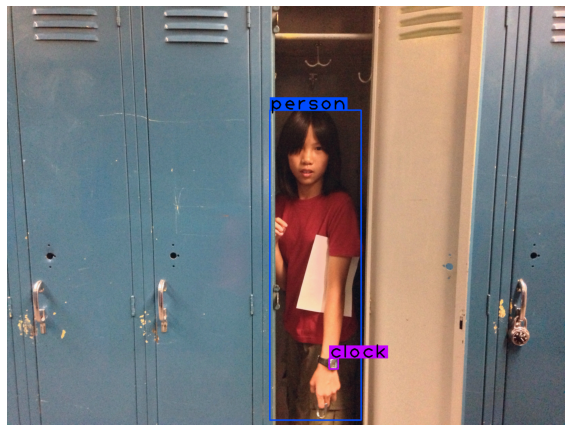

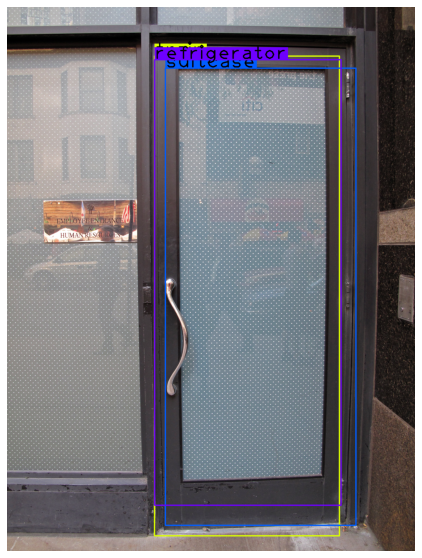

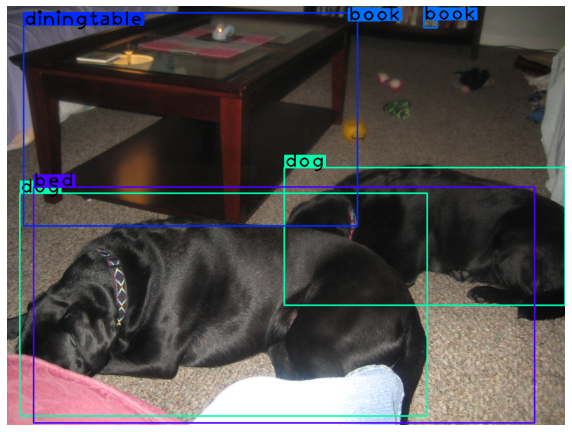

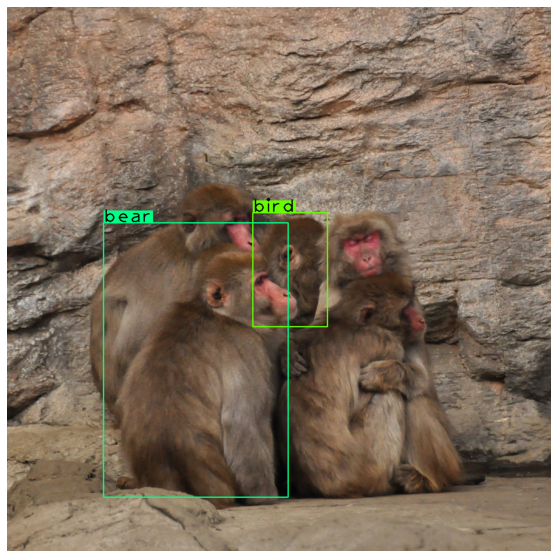

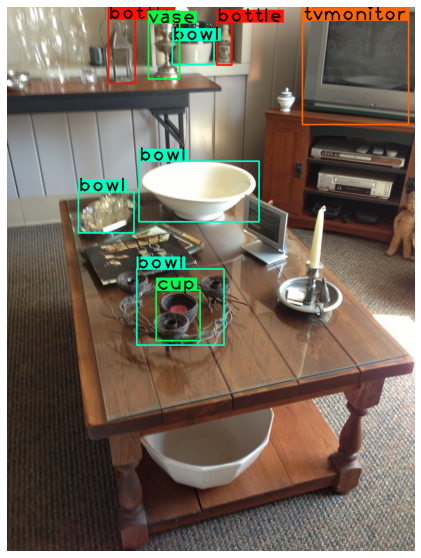

...

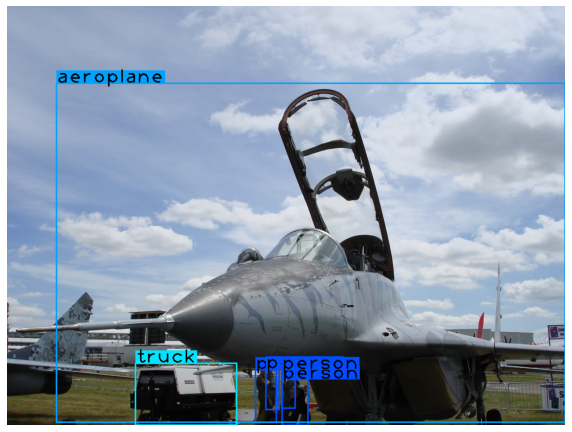

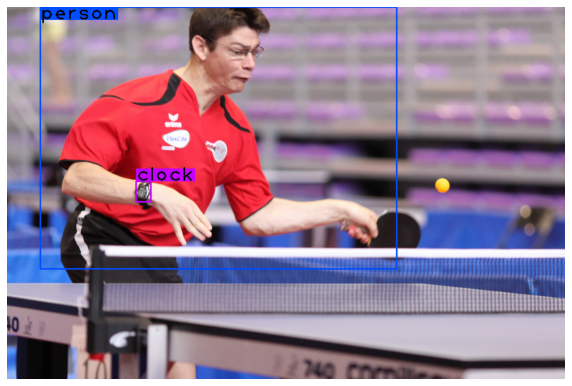

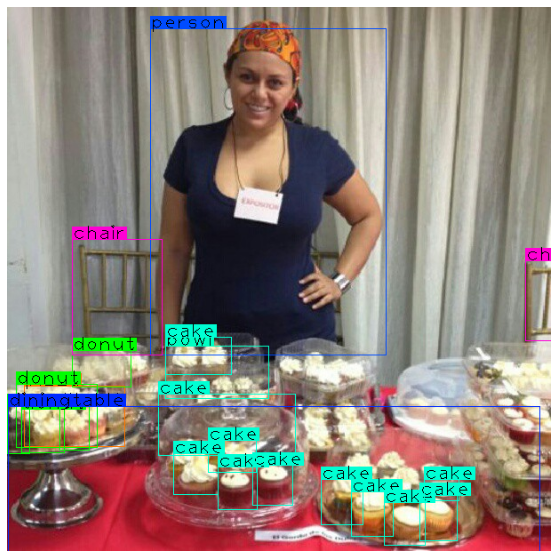

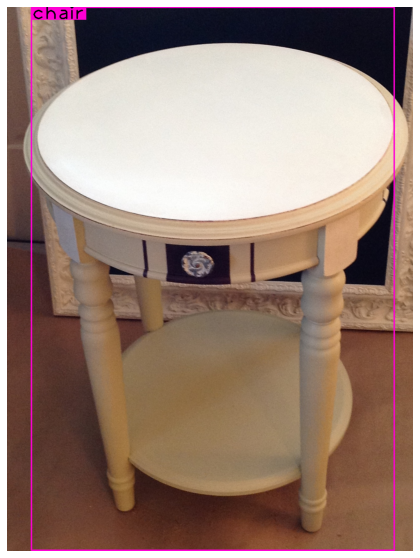

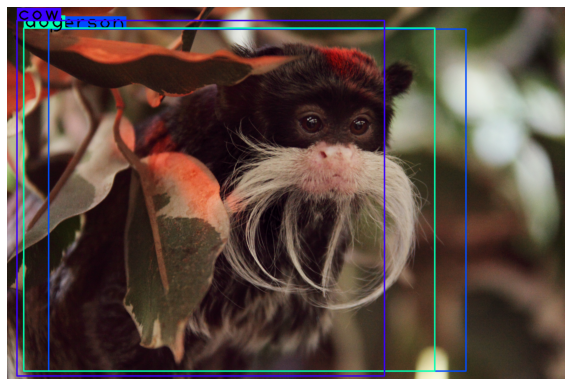

In [ ]:
for img_name in os.listdir('test_images/'):
    img_path = os.path.join('test_images', img_name)
    img = read_img(img_path)
    img_aspect = resize_aspect(img, 608, 608)
    inp = img_to_tensor(img_aspect)
    if CUDA:
        inp = inp.cuda()
    pred = model(inp, CUDA)
    output = write_results(pred, 0.2, 80)
    asp = aspect_transform(img.shape[1], img.shape[0], 608, 608)
    for res in output:
        if res is not None:
            res_original = inv_aspect_transform_results(res, asp)
            res_original = clamp_results(res_original, img.shape[1], img.shape[0])
            img_bbox = draw_predictions(img, res_original, palette, classes)
        else:
            img_bbox = img
        plt.figure(figsize=(10, 10))
        plt.imshow(img_bbox)
        plt.axis('off')
        plt.show()

In [ ]:
cap = cv2.VideoCapture('test_videos/room.mp4')
fourcc = cv2.VideoWriter_fourcc(*'MJPG')
out = cv2.VideoWriter('output.mp4', fourcc, 60.0, (768,  1328))

counter = 0
if not cap.isOpened():
    print("Cannot open the source")
while cap.isOpened():
    print(f'frame = {counter}')
    # Capture frame-by-frame
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break
    # Our operations on the frame come here
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    img_aspect = resize_aspect(img, 608, 608)
    inp = img_to_tensor(img_aspect)
    if CUDA:
        inp = inp.cuda()
    pred = model(inp, CUDA)
    output = write_results(pred, 0.4, 80)
    asp = aspect_transform(img.shape[1], img.shape[0], 608, 608)
    for res in output:
        if res is not None:
            res_original = inv_aspect_transform_results(res, asp)
            res_original = clamp_results(res_original, img.shape[1], img.shape[0])
            img_bbox = draw_predictions(cv2.cvtColor(img, cv2.COLOR_RGB2BGR), res_original, palette, classes)
        else:
            img_bbox = img
        out.write(img_bbox)
    counter += 1
    
    # Display the resulting frame
cap.release()
out.release()
cv2.destroyAllWindows()

frame = 0
frame = 1
frame = 2
frame = 3
frame = 4
frame = 5
frame = 6
frame = 7
frame = 8
frame = 9
frame = 10
frame = 11
frame = 12
frame = 13
frame = 14
frame = 15
frame = 16
frame = 17
frame = 18
frame = 19
frame = 20
frame = 21
frame = 22
frame = 23
frame = 24
frame = 25
frame = 26
frame = 27
frame = 28
frame = 29
frame = 30
frame = 31
frame = 32
frame = 33
frame = 34
frame = 35
frame = 36
frame = 37
frame = 38
frame = 39
frame = 40
frame = 41
frame = 42
frame = 43
frame = 44
frame = 45
frame = 46
frame = 47
frame = 48
frame = 49
frame = 50
frame = 51
frame = 52
frame = 53
frame = 54
frame = 55
frame = 56
frame = 57
frame = 58
frame = 59
frame = 60
frame = 61
frame = 62
frame = 63
frame = 64
frame = 65
frame = 66
frame = 67
frame = 68
frame = 69
frame = 70
frame = 71
frame = 72
frame = 73
frame = 74
frame = 75
frame = 76
frame = 77
frame = 78
frame = 79
frame = 80
frame = 81
frame = 82
frame = 83
frame = 84
frame = 85
frame = 86
frame = 87
frame = 88
frame = 89
frame = 90
frame = 9

In [ ]:
!wget https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv

--2021-06-02 17:45:14--  https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 64.233.170.128, 74.125.26.128, 172.217.193.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|64.233.170.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2258447590 (2.1G) [text/csv]
Saving to: ‘oidv6-train-annotations-bbox.csv’

oidv6-train-annotat 100%[===================>]   2.10G  87.6MB/s    in 19s     

2021-06-02 17:45:33 (115 MB/s) - ‘oidv6-train-annotations-bbox.csv’ saved [2258447590/2258447590]



In [ ]:
!wget https://raw.githubusercontent.com/openimages/dataset/master/downloader.py

--2021-06-02 17:45:43--  https://raw.githubusercontent.com/openimages/dataset/master/downloader.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4244 (4.1K) [text/plain]
Saving to: ‘downloader.py’

downloader.py       100%[===================>]   4.14K  --.-KB/s    in 0s      

2021-06-02 17:45:43 (25.8 MB/s) - ‘downloader.py’ saved [4244/4244]



In [ ]:
!wget https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv

--2021-06-02 17:58:21--  https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.217.128, 64.233.170.128, 108.177.11.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.217.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12011 (12K) [text/csv]
Saving to: ‘class-descriptions-boxable.csv’

class-descriptions- 100%[===================>]  11.73K  --.-KB/s    in 0s      

2021-06-02 17:58:21 (77.1 MB/s) - ‘class-descriptions-boxable.csv’ saved [12011/12011]



In [ ]:
import pandas as pd

In [ ]:
boxes = pd.read_csv('oidv6-train-annotations-bbox.csv')

In [ ]:
boxes.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
0,000002b66c9c498e,xclick,/m/01g317,1,0.012500,0.195312,0.148438,0.587500,0,1,0,0,0,0.148438,0.012500,0.059375,0.195312,0.148438,0.357812,0.587500,0.325000
1,000002b66c9c498e,xclick,/m/01g317,1,0.025000,0.276563,0.714063,0.948438,0,1,0,0,0,0.025000,0.248438,0.276563,0.214062,0.914062,0.714063,0.782813,0.948438
2,000002b66c9c498e,xclick,/m/01g317,1,0.151562,0.310937,0.198437,0.590625,1,0,0,0,0,0.243750,0.151562,0.310937,0.262500,0.198437,0.434375,0.507812,0.590625
3,000002b66c9c498e,xclick,/m/01g317,1,0.256250,0.429688,0.651563,0.925000,1,0,0,0,0,0.315625,0.429688,0.256250,0.423438,0.651563,0.921875,0.826562,0.925000
4,000002b66c9c498e,xclick,/m/01g317,1,0.257812,0.346875,0.235938,0.385938,1,0,0,0,0,0.317188,0.257812,0.346875,0.307812,0.235938,0.289062,0.348438,0.385938


In [ ]:
classes = pd.read_csv('class-descriptions-boxable.csv', header=None)
classes.head()

,0,1
0,/m/011k07,Tortoise
1,/m/011q46kg,Container
2,/m/012074,Magpie
3,/m/0120dh,Sea turtle
4,/m/01226z,Football


In [ ]:
classes[1]

0        Tortoise
1       Container
2          Magpie
3      Sea turtle
4        Football
          ...    
596    Wheelchair
597    Rugby ball
598     Armadillo
599       Maracas
600        Helmet
Name: 1, Length: 601, dtype: object

In [ ]:
@torch.no_grad
def eval_yolo(model, data_loader):
    model.eval()
    for inputs, targets in data_loader:
        preds = model(inputs)
        # compute some values
    # postprocess
    # return loss, metrics
    return


def train(model_cfg, data_cfg):
    model = get_model(model_cfg)
    data = get_data(data_cfg)
    train_yolo(model, data)


def train_yolo(model, data):
    model.train()
    for i in range(num_batches):
        batch_loss = 0
        for j in range(subdivisions):
            inputs, targets = next(train_loader):
            preds = model(inputs)
            loss = loss_yolo(preds, targets) * images.size(0) / batch_size
            loss.backward()
            train_loss = batch_loss
        optimizer.step()
        optimizer.zero_grad()
        scheduler.step()
        if i % epoch_size == 0:
            values = eval_yolo(model, val_loader)
            # log train_loss, val_loss, val_metrics to TB
            # save intermediate weights
    # save last weights


